# Lab 4

## Створити функцію, що в якості аргумента приймає адресу папки на диску та повертає датафрейм з наступною інформацією про зображення, що знаходяться в папці:
- ім’я файлу;
- кольорову модель;
- формат;
- кількість каналів у зображенні;
- розмір файлу у мегабайтах байтах, округлених до двох знаків після 
коми;
- ширину картинки;
- висоту картинки;
- повний шлях до файлу;
- зменшене зображення

,File Name,Color Model,Format,Channels,File Size (MB),Width,Height,Full Path,Image
0,khpi2.jpg,RGB,JPEG,3,0.31,1420,550,C:/Users/NikaLina/Python/photo\khpi2.jpg,
1,khpi_png.png,RGBA,PNG,4,2.64,1620,1620,C:/Users/NikaLina/Python/photo\khpi_png.png,
2,хпі 1.jpg,RGB,JPEG,3,0.24,1024,683,C:/Users/NikaLina/Python/photo\хпі 1.jpg,
3,хпі 3.jpg,RGB,JPEG,3,0.15,1024,684,C:/Users/NikaLina/Python/photo\хпі 3.jpg,
4,хпі 4.jpg,RGB,JPEG,3,0.16,1024,683,C:/Users/NikaLina/Python/photo\хпі 4.jpg,
5,хпі 5.jpg,RGB,JPEG,3,0.22,1024,737,C:/Users/NikaLina/Python/photo\хпі 5.jpg,
6,хпі10.jpg,RGB,JPEG,3,0.23,1155,650,C:/Users/NikaLina/Python/photo\хпі10.jpg,
7,хпі11.jpeg,RGB,JPEG,3,0.01,225,225,C:/Users/NikaLina/Python/photo\хпі11.jpeg,
8,хпі12.jpg,RGB,JPEG,3,0.11,1024,683,C:/Users/NikaLina/Python/photo\хпі12.jpg,
9,хпі13.jpeg,RGB,JPEG,3,0.01,361,140,C:/Users/NikaLina/Python/photo\хпі13.jpeg,

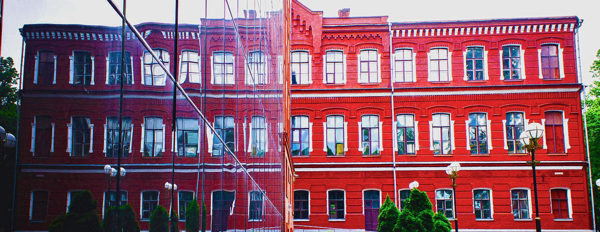
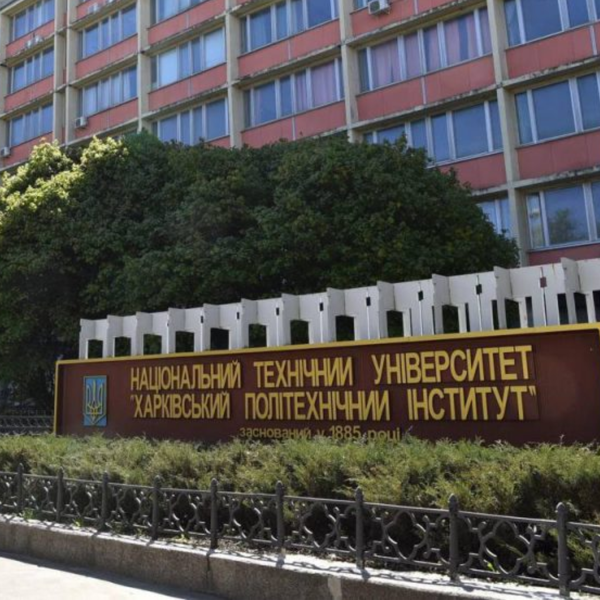
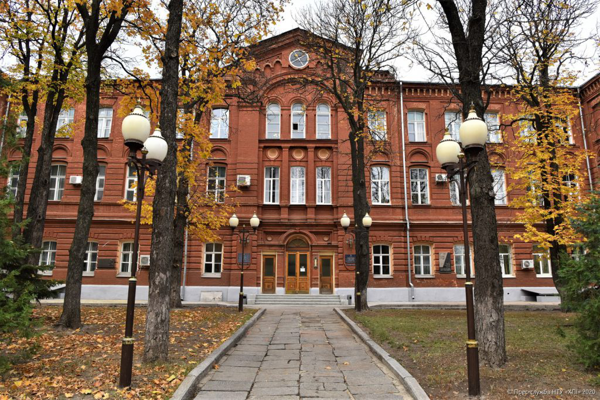
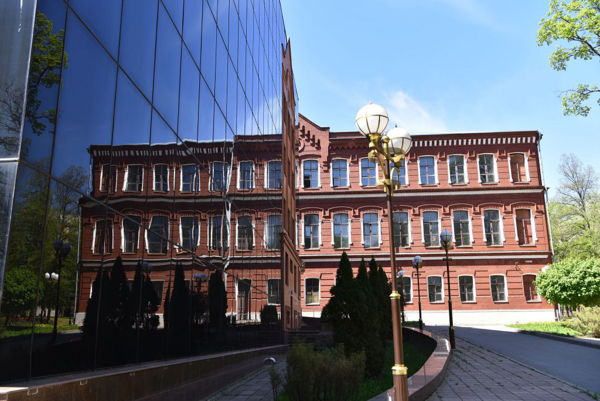
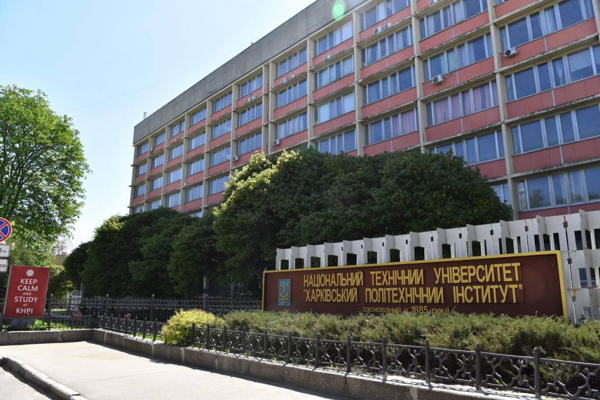
...
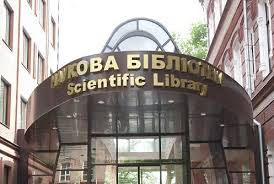
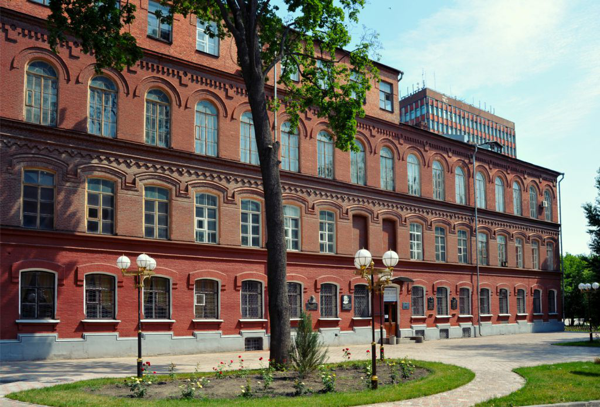
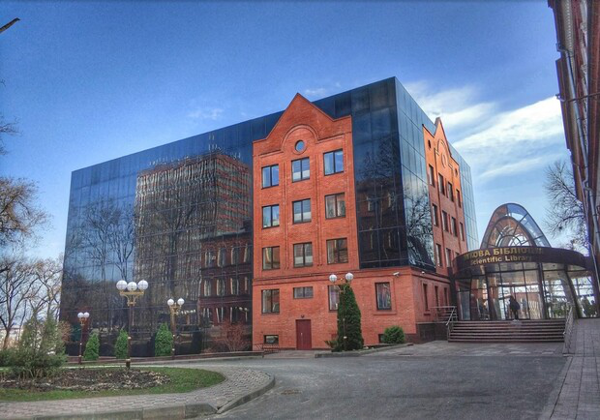
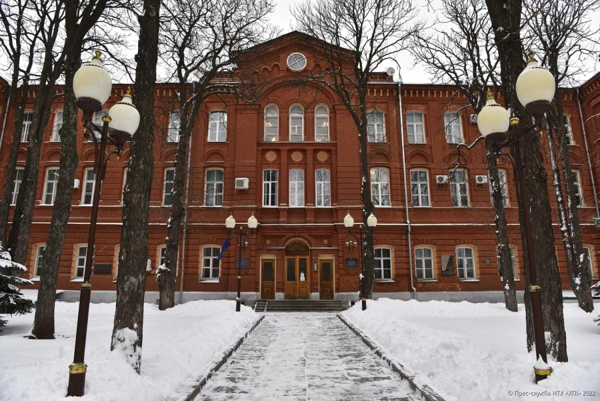
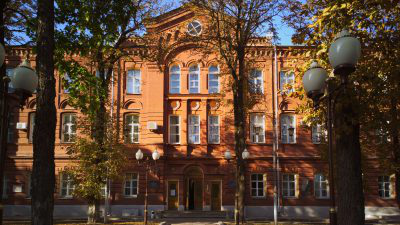

In [66]:
import os
import glob
from PIL import Image
import pandas as pd
import base64
from io import BytesIO
from IPython.core.display import HTML
import random

def extract_image_info_with_memory_thumbnails(folder_path):
    image_data = []

    all_files = glob.glob(os.path.join(folder_path, "*"))
    
    for file_path in all_files:
        try:
            with Image.open(file_path) as img:
                file_name = os.path.basename(file_path)
                color_model = img.mode
                image_format = img.format
                channels = len(img.getbands())
                file_size_mb = round(os.path.getsize(file_path) / (1024 * 1024), 2)
                width, height = img.size

                thumbnail = img.copy()
                thumbnail.thumbnail((600, 600))  
                buffer = BytesIO()
                thumbnail.save(buffer, format="PNG")
                encoded_img = base64.b64encode(buffer.getvalue()).decode("utf-8")
                embedded_img = f'<img src="data:image/png;base64,{encoded_img}" width="100" height="100">'

                image_data.append({
                    "File Name": file_name,
                    "Color Model": color_model,
                    "Format": image_format,
                    "Channels": channels,
                    "File Size (MB)": file_size_mb,
                    "Width": width,
                    "Height": height,
                    "Full Path": file_path,
                    "Image": embedded_img
                })
        except (IOError, SyntaxError):
            continue

    df_images = pd.DataFrame(image_data)
    return df_images

folder_path = "C:/Users/NikaLina/Python/photo"

df_images = extract_image_info_with_memory_thumbnails(folder_path)

HTML(df_images.to_html(escape=False, formatters={'Image': lambda x: x}))


### Створити функцію, що в якості аргумента приймає:
- шлях до папки;
- назва вихідного зображення;
- кількість зображень в рядку;
- кількість зображень в стовпчику
і повертає зображення постера.

###  Створити функцію, що перетворює картинку на квадрат з максимально можливим розміром сторон.

In [69]:
from PIL import Image

def crop_images_to_square(folder_path, output_folder):

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    all_files = glob.glob(os.path.join(folder_path, "*"))

    for file_path in all_files:
        try:
            with Image.open(file_path) as img:
                min_side = min(img.size)
                width, height = img.size

                left = (width - min_side) // 2
                top = (height - min_side) // 2
                right = left + min_side
                bottom = top + min_side

                cropped_img = img.crop((left, top, right, bottom))
                output_path = os.path.join(output_folder, os.path.basename(file_path))
                cropped_img.save(output_path)

        except (IOError, SyntaxError) as e:
            print(f"Skipping file (not an image): {file_path} - {e}")

folder_path = "C:/Users/NikaLina/Python/photo"  
output_folder = "C:/Users/NikaLina/Python/photo_cropped" 

df_cropped_images = crop_images_to_square(folder_path, output_folder)


### Функція накладання на картинку фільтру червоного, зеленого, синього, жовтого, пурпурного або голубого кольорів, що обираються випадковим чином

In [71]:
def apply_random_color_filter(image):
    filters = {
        "red": (255, 0, 0),
        "green": (0, 255, 0),
        "blue": (0, 0, 255),
        "yellow": (255, 255, 0),
        "magenta": (255, 0, 255),
        "cyan": (0, 255, 255),
    }
    filter_color = random.choice(list(filters.values()))

    overlay = Image.new("RGB", image.size, filter_color)
    return Image.blend(image.convert("RGB"), overlay, alpha=0.4)  # Blend with 40% intensity

## Створення постеру

In [73]:
def create_poster_with_filters(folder_path, output_image_name, images_per_row, images_per_column, output_folder):

    cropped_folder = os.path.join(output_folder, "cropped_images")
    crop_images_to_square(folder_path, cropped_folder)
  
    image_size = 500  
    poster_width = images_per_row * image_size
    poster_height = images_per_column * image_size

    poster = Image.new("RGB", (poster_width, poster_height))

    image_files = [f for f in os.listdir(cropped_folder) if f.lower().endswith(('png', 'jpg', 'jpeg'))]

    if not image_files:
        raise ValueError("No images found in the specified folder.")

    for row in range(images_per_column):
        for col in range(images_per_row):
            random_image_file = random.choice(image_files) 
            with Image.open(os.path.join(folder_path, random_image_file)) as img:
                resize_img = img.resize((image_size, image_size))
                filtered_img = apply_random_color_filter(resize_img)
                poster.paste(filtered_img, (col * image_size, row * image_size))

    output_path = os.path.join(output_folder, output_image_name)
    poster.save(output_path)
    print(f"Poster saved at: {output_path}")
    return output_path



Poster saved at: C:/Users/NikaLina/Python/posters_with_filters\poster_1_with_filters.jpg


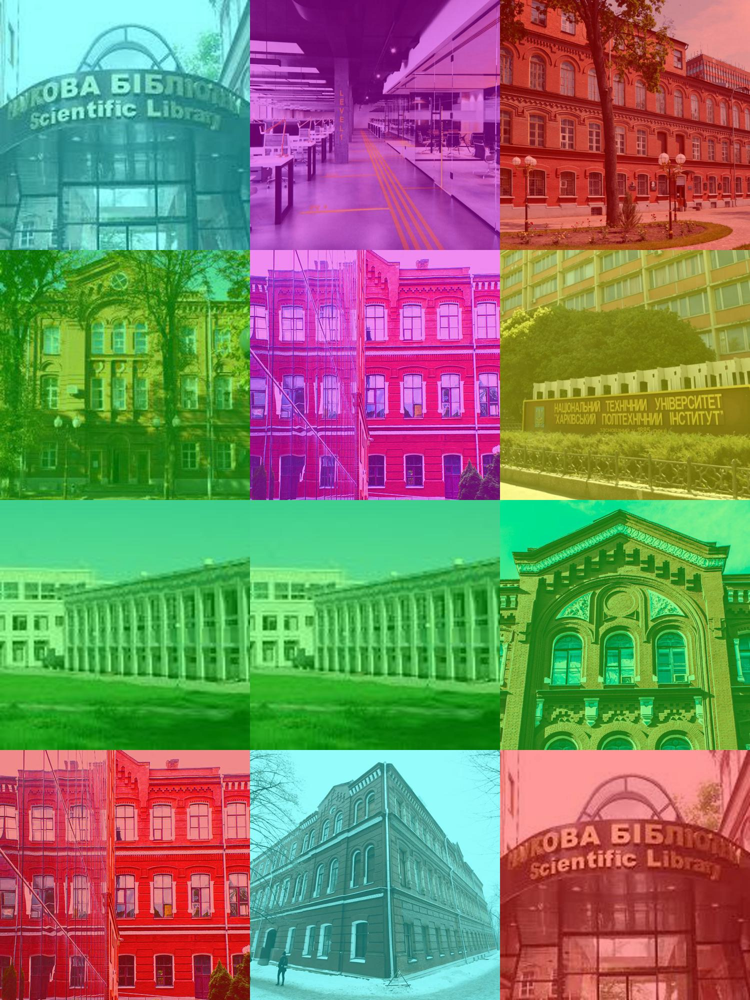

Poster saved at: C:/Users/NikaLina/Python/posters_with_filters\poster_2_with_filters.jpg


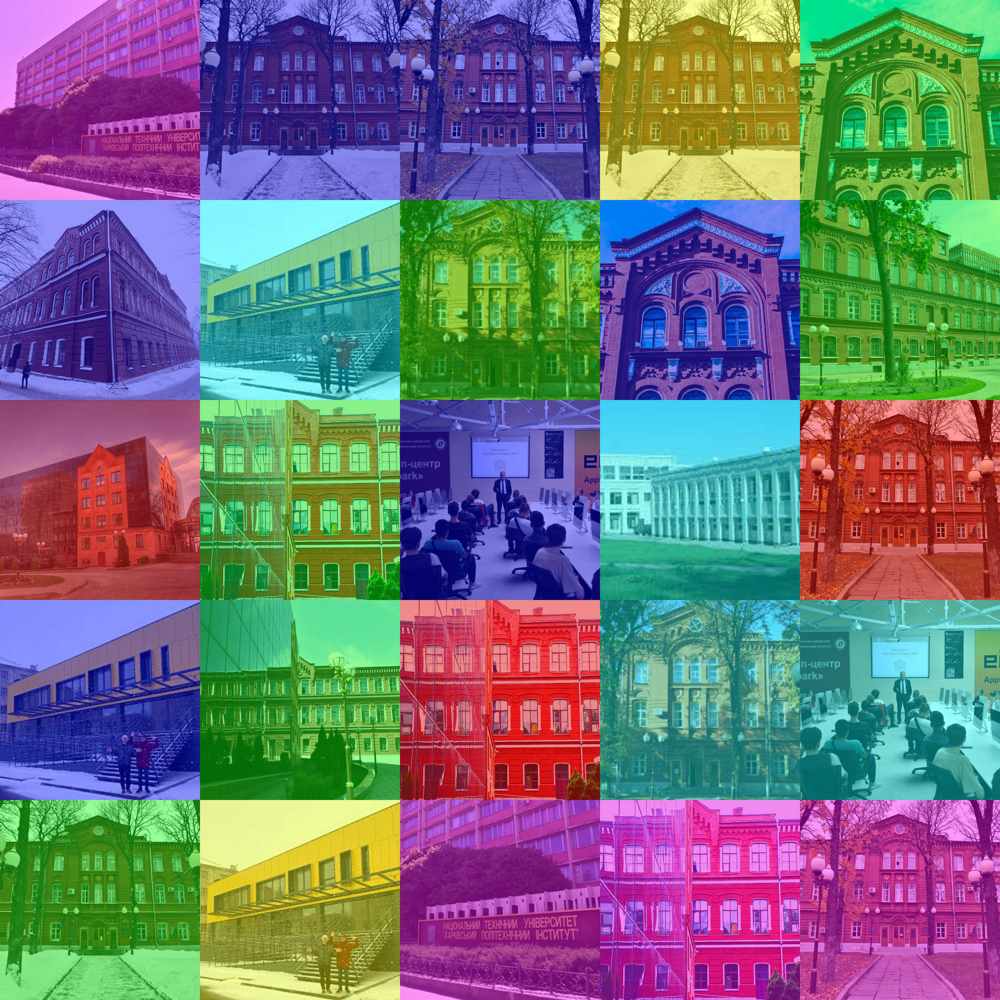

Poster saved at: C:/Users/NikaLina/Python/posters_with_filters\poster_3_with_filters.jpg


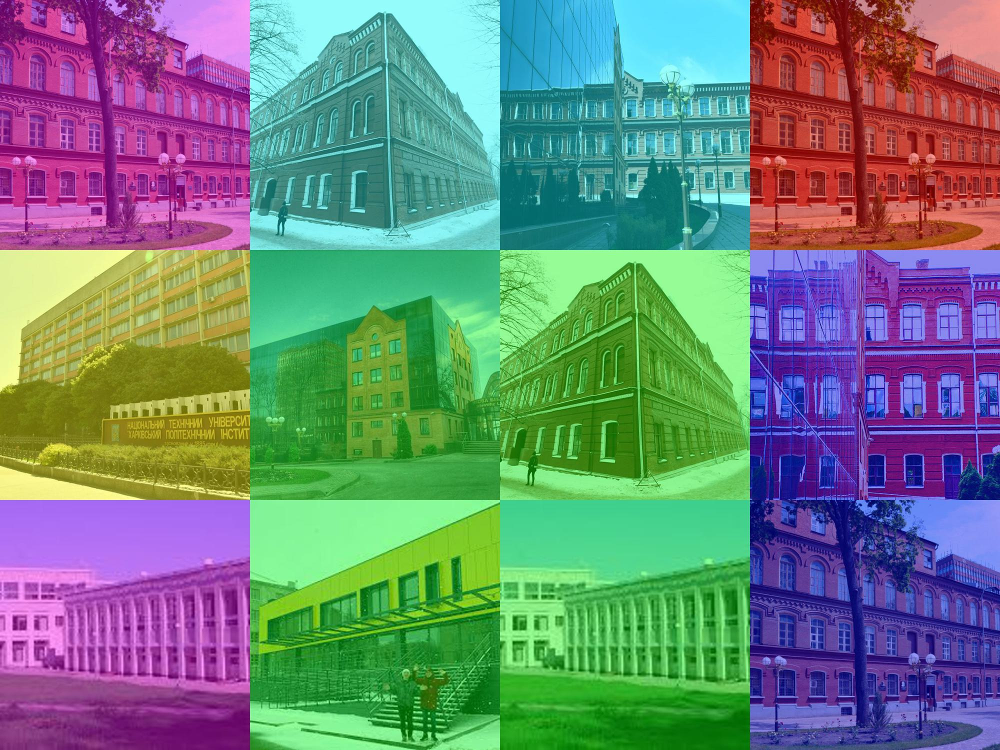

In [92]:
from IPython.display import Image as IPImage, display

def display_poster(poster_path):
    display(IPImage(poster_path))



folder_path = "C:/Users/NikaLina/Python/photo_cropped"  
output_folder = "C:/Users/NikaLina/Python/posters_with_filters" 

poster_path1 = create_poster_with_filters(folder_path, "poster_1_with_filters.jpg", 3, 4, output_folder)
display_poster(poster_path1)
poster_path2 = create_poster_with_filters(folder_path, "poster_2_with_filters.jpg", 5, 5, output_folder)
display_poster(poster_path2)
poster_path3 = create_poster_with_filters(folder_path, "poster_3_with_filters.jpg", 4, 3, output_folder)
display_poster(poster_path3)